In [28]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

from pathlib import Path
from matplotlib.colors import LogNorm

from sklearn.preprocessing import MinMaxScaler, StandardScaler
from model_util import *

In [29]:
df_Ch022 = pd.DataFrame(pd.read_pickle(Path("../process/Ch022.pkl")))
y_pred_test = pd.DataFrame(pd.read_pickle(Path("./saved_models/log_SVM_predict_test.pkl"))).values
df_metrics = pd.DataFrame(pd.read_pickle(Path("./saved_models/log_SVM_metrics_test.pkl")))

In [30]:
split=int(len(df_Ch022.index)*0.15)
LOG_SCALE= True
scaler= MinMaxScaler()

df_output_scaled, output_scaler = data_scale(df_Ch022, scaler, LOG_SCALE= LOG_SCALE, output= True)
y_test = output_scaler.inverse_transform(df_output_scaled)[:split]
if LOG_SCALE:
    y_test = 10 ** y_test

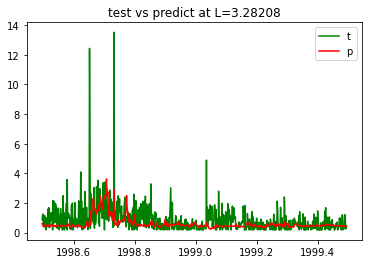

In [31]:
p=13
plt.figure()
plt.plot(df_Ch022.index[:split], y_test[:,p], color="green")
plt.plot(df_Ch022.index[:split], y_pred_test[:,p], color="red")
plt.title("test vs predict at L={}".format(df_Ch022.columns[p]))
plt.legend("tp")
plt.show()

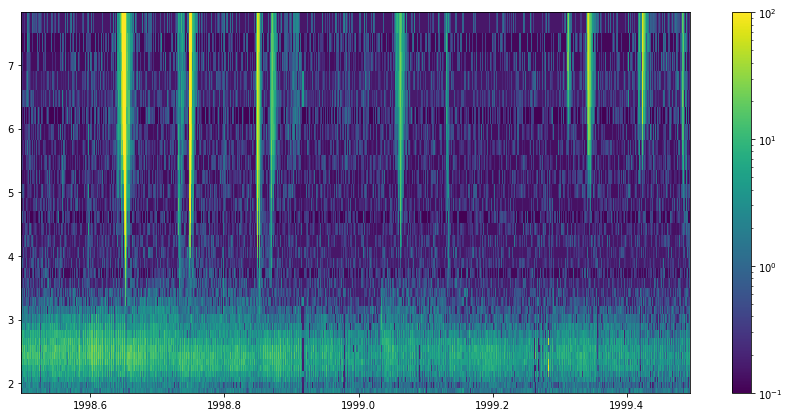

In [32]:
plt.figure(figsize=(15, 7))
plt.pcolormesh(
    df_Ch022.index[:split],
    df_Ch022.columns,
    y_test.T,
    norm=LogNorm(1e-1,1e2),
    shading="auto",
)
plt.colorbar()
plt.show()

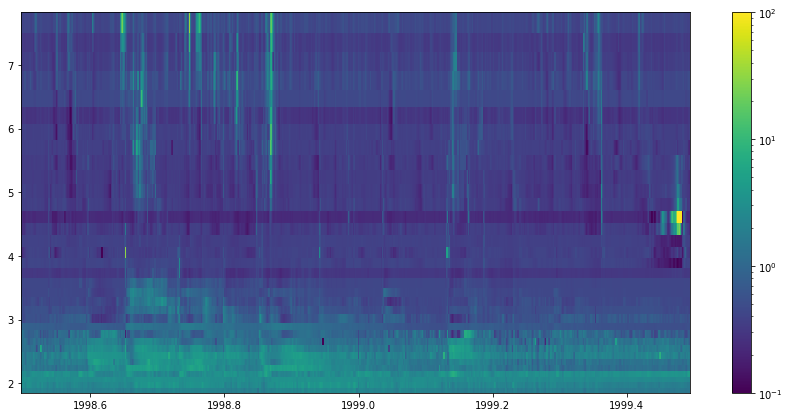

In [33]:
plt.figure(figsize=(15, 7))
plt.pcolormesh(
    df_Ch022.index[:split],
    df_Ch022.columns,
   y_pred_test.T,
    norm=LogNorm(1e-1, 1e2),
    shading="auto",
)
plt.colorbar()
plt.show()

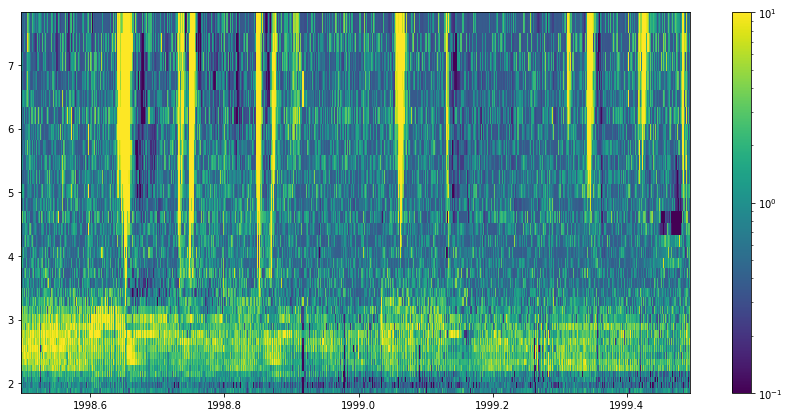

In [34]:
plt.figure(figsize=(15, 7))
plt.pcolormesh(
    df_Ch022.index[:split],
    df_Ch022.columns,
    y_test.T /  y_pred_test.T,
    norm=LogNorm(1e-1, 10),
    shading="auto",
)
plt.colorbar()
plt.show()

In [35]:
df_metrics.mean()

MAE       2.470581
MSE     299.394986
RMSE     12.170500
dtype: float64

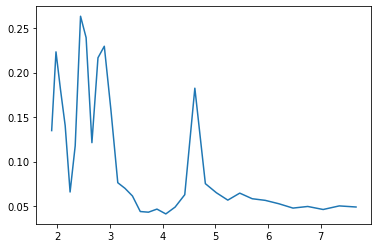

In [36]:
plt.plot(df_Ch022.columns, df_metrics["RMSE"]/y_test.max(axis=0))

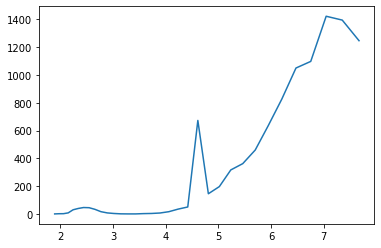

In [37]:
plt.plot(df_Ch022.columns, df_metrics["MSE"])
# plt.savefig(Path("../Results/fefs"), facecolor="w")